# Dataset Analysis

PXD030304 from the [Pan-cancer proteomic map of 949 human cell lines](https://www.cell.com/cancer-cell/fulltext/S1535-6108(22)00274-4?dgcid=raven_jbs_aip_email). Dataset is available [here](https://www.ebi.ac.uk/pride/archive/projects/PXD030304).

In [4]:
dataset_name = "PXD030304"

In [5]:
import re
import umap
import numpy as np
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt

from helper import load_tsv_with_condition

/Users/ritagama/Documents/repos/GainPro/.gain/lib/python3.14/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [6]:
file_path = Path("../../data/raw/PXD030304.tsv")
df = load_tsv_with_condition(file_path)

In [7]:
print(f"{df.shape[0]} samples across {df.shape[1]-1} proteins.")
print(f"Number of unique conditions {len(df["condition"].unique())}.")

2012 samples across 8754 proteins.
Number of unique conditions 950.


## A.1. Filtering dataset

It has a control cell line, the HEK293T. We will dropped it. And will have 949 samples after all.

### Drop control cell line

In [8]:
df_no_control = df[df["condition"] != "HEK293T"]
print(f"{df_no_control.shape[0]} samples across {df_no_control.shape[1]-1} proteins.")
df_no_control.to_csv("../../data/processed/PXD030304/PXD030304_no_control.csv", index=True) # no control cell line

949 samples across 8754 proteins.


In [9]:
# sanity check
df_aux = pd.read_csv("../../data/processed/PXD030304/PXD030304_no_control.csv", index_col=0)
assert df_aux.shape[0] == df_no_control.shape[0] and df_aux.shape[1]-1 == df_no_control.shape[1]-1

### Filter multi peptide proteins

Filter multi peptide proteins (6692) described in the paper.

In [10]:
excel_df = pd.read_excel("../../data/raw/Supplementary Table 2.xlsx", sheet_name=1)

In [11]:
excel_df.shape

(950, 6693)

In [12]:
excel_df

,Table S2 Protein matrix. Related to Figure 1,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 6683,Unnamed: 6684,Unnamed: 6685,Unnamed: 6686,Unnamed: 6687,Unnamed: 6688,Unnamed: 6689,Unnamed: 6690,Unnamed: 6691,Unnamed: 6692
0,Project_Identifier,P37108;SRP14_HUMAN,Q96JP5;ZFP91_HUMAN,Q9Y4H2;IRS2_HUMAN,P36578;RL4_HUMAN,Q6SPF0;SAMD1_HUMAN,O76031;CLPX_HUMAN,Q8WUQ7;CATIN_HUMAN,A6NIH7;U119B_HUMAN,Q9BTD8;RBM42_HUMAN,...,P33151;CADH5_HUMAN,Q5EBL4;RIPL1_HUMAN,P49715;CEBPA_HUMAN,Q5TA45;INT11_HUMAN,O14924;RGS12_HUMAN,Q7Z3B1;NEGR1_HUMAN,O60669;MOT2_HUMAN,Q13571;LAPM5_HUMAN,Q96JM2;ZN462_HUMAN,P35558;PCKGC_HUMAN
1,SIDM00018;K052,7.10955,3.41494,NaN,7.86661,3.89547,4.19666,NaN,NaN,3.19088,...,NaN,NaN,3.90064,2.63998,NaN,NaN,NaN,NaN,NaN,NaN
2,SIDM00023;TE-12,6.82802,4.14346,2.23781,7.62878,3.19811,4.60902,NaN,2.47059,3.69535,...,NaN,NaN,NaN,3.19608,NaN,NaN,NaN,NaN,NaN,NaN
3,SIDM00040;TMK-1,7.01426,4.19987,2.44055,8.12459,NaN,4.76881,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,SIDM00041;STS-0421,5.28591,3.35789,NaN,7.97268,NaN,4.52092,NaN,NaN,2.73088,...,NaN,NaN,NaN,2.79023,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
945,SIDM01248;CGTH-W-1,6.31631,4.86933,NaN,7.62433,3.92689,4.47212,NaN,NaN,3.48464,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
946,SIDM01251;H9,6.23087,2.71686,NaN,7.23503,3.42065,4.7178,NaN,NaN,3.62514,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
947,SIDM01259;GR-ST,7.00407,NaN,NaN,7.5815,NaN,4.59082,NaN,NaN,3.3296,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
948,SIDM01261;YMB-1-E,6.76532,3.75777,NaN,7.24133,3.05477,4.7403,NaN,NaN,2.56268,...,NaN,3.43213,NaN,2.46381,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
proteins_to_filter = excel_df.iloc[0]

In [14]:
proteins_to_filter = proteins_to_filter[1:6993]

In [15]:
proteins_to_filter

Unnamed: 1       P37108;SRP14_HUMAN
Unnamed: 2       Q96JP5;ZFP91_HUMAN
Unnamed: 3        Q9Y4H2;IRS2_HUMAN
Unnamed: 4         P36578;RL4_HUMAN
Unnamed: 5       Q6SPF0;SAMD1_HUMAN
                        ...        
Unnamed: 6688    Q7Z3B1;NEGR1_HUMAN
Unnamed: 6689     O60669;MOT2_HUMAN
Unnamed: 6690    Q13571;LAPM5_HUMAN
Unnamed: 6691    Q96JM2;ZN462_HUMAN
Unnamed: 6692    P35558;PCKGC_HUMAN
Name: 0, Length: 6692, dtype: object

In [16]:
type(proteins_to_filter)

pandas.core.series.Series

In [17]:
name_proteins_to_filter = proteins_to_filter.apply(lambda x: re.search(r'^([^;]+);', x).group(1))

In [18]:
name_proteins_to_filter

Unnamed: 1       P37108
Unnamed: 2       Q96JP5
Unnamed: 3       Q9Y4H2
Unnamed: 4       P36578
Unnamed: 5       Q6SPF0
                  ...  
Unnamed: 6688    Q7Z3B1
Unnamed: 6689    O60669
Unnamed: 6690    Q13571
Unnamed: 6691    Q96JM2
Unnamed: 6692    P35558
Name: 0, Length: 6692, dtype: object

In [19]:
not_present = ['P10636', 'P05386', 'P01854', 'P69905', 'P07205', 'P08758', 'P00441', 'Q06830', 'P00915', 'Q04695', 'P02533', 'P99999', 'P20930', 'P04040', 'P08729', 'P05787', 'P02768', 'P13645', 'Q7Z3Y7', 'P09211', 'P06396', 'P19012', 'P13646', 'Q9UKY3', 'P35900', 'P07339', 'Q9C075', 'O95678', 'P15559', 'Q9H2K0', 'Q99717', 'P62937', 'Q9NSB2', 'P01880', 'Q6KB66', 'P08779', 'P08311', 'P13647', 'P78386', 'Q8N1N4', 'P61626', 'Q8NC44', 'P00918', 'P10599', 'P19013', 'P11309', 'P56134', 'Q5MY95', 'Q9P2N6', 'P55957', 'Q86Y13', 'Q96S82', 'O00762', 'Q8N7X0', 'Q7Z794', 'Q5FBB7', 'Q9P2P6', 'Q92903', 'P57071', 'P16083', 'P68871', 'Q15843', 'P05413', 'P00167', 'P63313', 'Q06033', 'P01857', 'P06732', 'P02144', 'P01344', 'P02538', 'P13284', 'Q96E14', 'Q96RR4', 'P61769', 'Q53S33', 'Q9Y2I7', 'Q4KMG0', 'Q9UK55', 'P63165', 'Q96JB1', 'P30711', 'Q86Y46', 'P0C870', 'Q9HB66', 'Q7Z4R8']
print(len(not_present))

86


In [20]:
# number proteins to filter
print(len(name_proteins_to_filter))

6692


In [21]:
common_proteins = df_no_control.columns.intersection(name_proteins_to_filter)
df_no_control_multi_peptide_proteins = df_no_control[common_proteins]
df_no_control_multi_peptide_proteins["condition"] = df_no_control["condition"]

/var/folders/xh/sc83qkdn4452g73ky21k64rw0000gn/T/ipykernel_6283/2572879366.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_no_control_multi_peptide_proteins["condition"] = df_no_control["condition"]


It turns out we only have 6606 proteins in common between the proteins described in the paper with more than one peptide and the PXD030304 dataset we have available.

In [22]:
df_no_control_multi_peptide_proteins.shape

(949, 6607)

In [23]:
assert df_no_control_multi_peptide_proteins.shape[0] == df_no_control.shape[0] and df_no_control_multi_peptide_proteins.shape[1] == 6606 + 1

In [24]:
df_no_control_multi_peptide_proteins.to_csv("../../data/processed/PXD030304/PXD030304_no_control_multi_peptide.csv", index=True)

In [25]:
# sanity check
df_aux = pd.read_csv("../../data/processed/PXD030304/PXD030304_no_control_multi_peptide.csv", index_col=0)
assert df_aux.shape[0] == df_no_control_multi_peptide_proteins.shape[0] and df_aux.shape[1] == df_no_control_multi_peptide_proteins.shape[1]
assert "condition" in df_aux.columns

## A.2. Analysis

### A.2.1. Value distribution

In [26]:
# plt.hist(df_no_control_multi_peptide_proteins.drop(columns=["condition"]).values, bins=100)
# plt.xlabel("Protein intensity")
# plt.ylabel("Frequency")
# ax = plt.gca()
# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)
# plt.show()

Mean value per protein

In [27]:
mean_protein_intensity = df_no_control_multi_peptide_proteins.drop(columns=["condition"]).mean()

In [28]:
mean_protein_intensity

protein
A0A0B4J1V0    5.704761
A0A0U1RRL7    6.105082
A0AV96        5.796524
A0AVT1        5.930318
A0FGR8        6.079841
                ...   
Q9Y6X5        5.728393
Q9Y6X8        5.307524
Q9Y6X9        5.523826
Q9Y6Y0        5.429938
Q9Y6Y8        5.974861
Length: 6606, dtype: float64

In [29]:
# plt.boxplot()
# plt.show()

### A.2.2. Missingness

In [30]:
#todo missingness total do dataset

#### A.2.2.1. Missingness per protein

In [31]:
missing_counts = df_no_control_multi_peptide_proteins.drop(columns=["condition"]).isna().sum(axis=0)

In [32]:
missing_counts

protein
A0A0B4J1V0    920
A0A0U1RRL7    396
A0AV96        463
A0AVT1          1
A0FGR8          2
             ... 
Q9Y6X5         60
Q9Y6X8        288
Q9Y6X9          4
Q9Y6Y0        401
Q9Y6Y8          9
Length: 6606, dtype: int64

In [33]:
missing_pct = (missing_counts / df_no_control_multi_peptide_proteins.shape[0]) * 100
print(missing_pct.describe())
mean = missing_pct.mean()
median = missing_pct.median()
print(median)

count    6606.000000
mean       23.997279
std        28.288033
min         0.000000
25%         0.526870
50%        10.115911
75%        42.676502
max        98.735511
dtype: float64
10.1159114857745


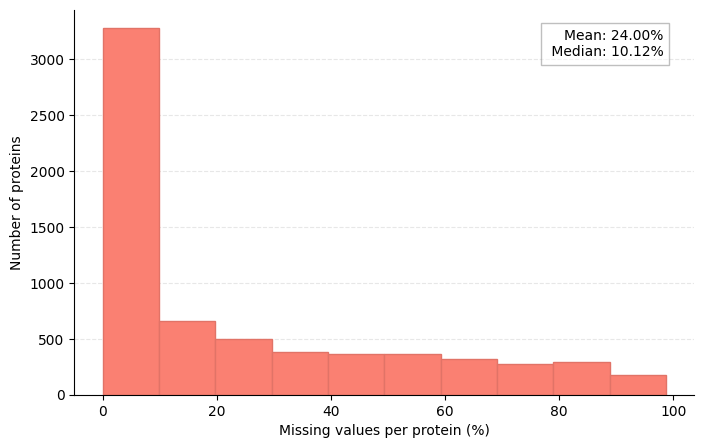

In [34]:
import matplotlib.colors as mcolors

def darker(color, factor=0.8):
    r, g, b = mcolors.to_rgb(color)
    return (r*factor, g*factor, b*factor)

color = "salmon"

plt.figure(figsize=(8,5))
plt.hist(missing_pct, bins=10, color=color, edgecolor=darker(color,0.90), linewidth=1)
plt.ylabel("Frequency")
plt.text(0.95, 0.95, f'Mean: {mean:.2f}%\n Median: {median:.2f}%', 
         horizontalalignment='right', verticalalignment='top', 
         transform=plt.gca().transAxes,
         fontsize=10, bbox=dict(facecolor='white', alpha=0.5, edgecolor='gray'))
ax = plt.gca()
plt.grid(axis='y', alpha=0.3, linestyle="--")
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_axisbelow(True)
plt.xlabel('Missing values per protein (%)')
plt.ylabel('Number of proteins')
plt.savefig("plots/PXD030304_missingness_per_protein_versionA.png")
plt.show()

How many proteins have missingness of 0? #todo

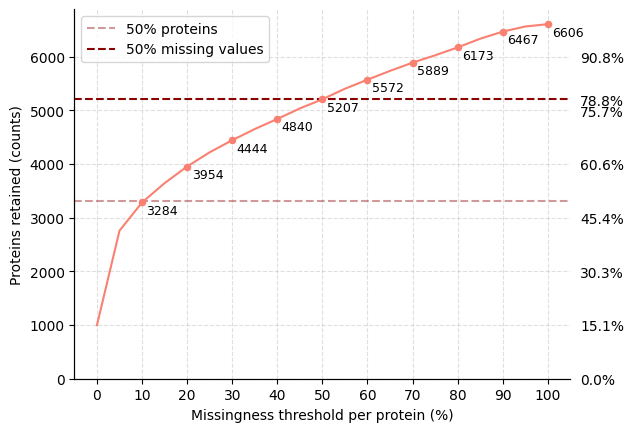

In [108]:
thresholds = range(0,101,5)
proteins_retained = np.array([(missing_pct <= t).sum() for t in thresholds])

plt.plot(thresholds, proteins_retained, color="salmon")
plt.xlabel("Missingness threshold per protein (%)")
plt.ylabel("Proteins retained")
dot_thresholds = np.arange(10, 101, 10)

for t in dot_thresholds:
    
    idx = np.where(thresholds == t)[0][0]
    prot = proteins_retained[idx]

    plt.scatter(t, prot, zorder=3, color="salmon", s=20)
    plt.text(t + 1, prot - 150, f"{prot}", fontsize=9, ha="left", va="center")

ax = plt.gca()
plt.grid(alpha=0.4, linestyle="--")
ax.set_axisbelow(True)

plt.axhline(
    df_no_control_multi_peptide_proteins.shape[1]/2, 
    linestyle="--", 
    alpha=0.4, 
    color="darkred",
    label="50% proteins"
)

# line to represent the % of retained proteins with 50% as the threshold
thresholds_aux = np.array(thresholds)
idx_50pct = np.where(thresholds_aux==50)
y_at_50pct = proteins_retained[idx_50pct]

plt.axhline(
    y=y_at_50pct,
    linestyle="--",
    color="darkred",
    label=f"50% missing values"
)

plt.legend()
plt.xticks(np.arange(0, 101, 10))

total_proteins = len(missing_pct)

# primary axis
yticks = np.arange(0, proteins_retained.max(), 1000)
ax.set_yticks(yticks)
ax.set_ylabel("Proteins retained (counts)")

# secondary axis
ax2 = ax.twinx()
ax2.set_ylim(ax.get_ylim())

pct_labels = [f"{y/total_proteins:.1%}" for y in yticks]
pct_labels.append(f"{y_at_50pct.item() / total_proteins:.1%}")
yticks = np.append(yticks, [y_at_50pct])
ax2.set_yticks(yticks)
ax2.set_yticklabels(pct_labels)
# ax2.set_ylabel("%")

for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)
    ax2.spines[spine].set_visible(False)

ax2.tick_params(right=False)

plt.savefig("plots/PXD030304/PXD030304_no_control_multi_peptide_proteins_retained_vs_missingness_threshold_50pct.png")
plt.show()

#### A.2.2.2. Missingness per sample

In [36]:
sample_missing_counts = df_no_control_multi_peptide_proteins.drop(columns=["condition"]).isna().sum(axis=1)
sample_missing_counts

sample_accession
PXD030304-Sample-1      1437
PXD030304-Sample-10     1389
PXD030304-Sample-100    1660
PXD030304-Sample-101    1883
PXD030304-Sample-102    1623
                        ... 
PXD030304-Sample-95     2040
PXD030304-Sample-96     1211
PXD030304-Sample-97     1826
PXD030304-Sample-98     1449
PXD030304-Sample-99     1189
Length: 949, dtype: int64

In [37]:
sample_missing_pct = (sample_missing_counts / df_no_control_multi_peptide_proteins.shape[1]) * 100
sample_missing_pct.describe()

count    949.000000
mean      23.993647
std        4.474044
min       14.863024
25%       20.992886
50%       23.248070
75%       26.290298
max       57.620705
dtype: float64

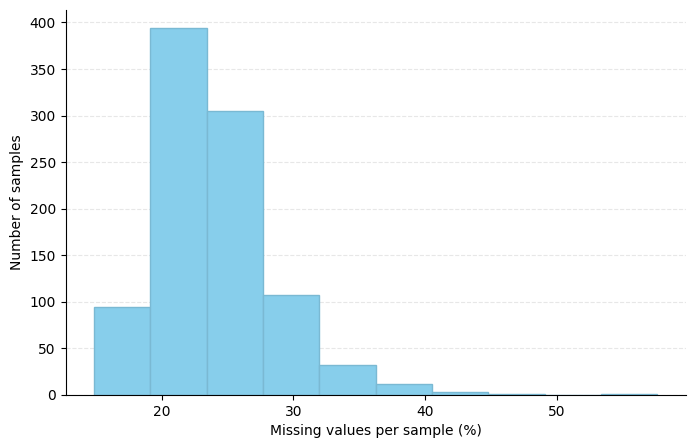

In [38]:
import matplotlib.colors as mcolors

def darker(color, factor=0.8):
    r, g, b = mcolors.to_rgb(color)
    return (r*factor, g*factor, b*factor)

color = "skyblue"

plt.figure(figsize=(8,5))
plt.hist(sample_missing_pct, bins=10, color=color, edgecolor=darker(color,0.90), linewidth=1)
plt.ylabel("Frequency")
ax = plt.gca()
plt.grid(axis='y', alpha=0.3, linestyle="--")
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_axisbelow(True)
plt.xlabel('Missing values per sample (%)')
plt.ylabel('Number of samples')
plt.savefig("plots/PXD030304_missingness_per_sample.png")
plt.show()

### A.2.4. Condition

In [48]:
#todo

## Continuing A.1. Filtering dataset

So, after having a more concrete understanding of the protein missingness (A.2.2.), we can remove proteins that have a missingness higher than a certain threshold.

Discard proteins with >**50**% missing values.
- Still ensures at least half of the samples have measurements.
- 50% aligns nicely with the 75th percentile (~43%), meaning we remove the worst tail.

### Drop proteins with more than 50% missingness

In [49]:
missing_pct

protein
A0A0B4J1V0    96.944152
A0A0U1RRL7    41.728135
A0AV96        48.788198
A0AVT1         0.105374
A0FGR8         0.210748
                ...    
Q9Y6X5         6.322445
Q9Y6X8        30.347734
Q9Y6X9         0.421496
Q9Y6Y0        42.255005
Q9Y6Y8         0.948367
Length: 6606, dtype: float64

In [50]:
mask = missing_pct <= 50
df_condition = df_no_control_multi_peptide_proteins["condition"]
df_aux = df_no_control_multi_peptide_proteins.drop(columns=["condition"])
df_no_control_multi_peptide_proteins_50pct = df_aux[df_aux.columns[mask]]
df_no_control_multi_peptide_proteins_50pct["condition"] = df_condition
df_no_control_multi_peptide_proteins_50pct.to_csv("../../data/processed/PXD030304/PXD030304_no_control_multi_peptide_50pct.csv", index=True)

/var/folders/xh/sc83qkdn4452g73ky21k64rw0000gn/T/ipykernel_6283/3094251076.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_no_control_multi_peptide_proteins_50pct["condition"] = df_condition


In [51]:
df_no_control_multi_peptide_proteins_50pct.shape

(949, 5208)

In [52]:
read_df = pd.read_csv("../../data/processed/PXD030304/PXD030304_no_control_multi_peptide_50pct.csv", index_col=0)
assert read_df.shape[0] == df_no_control_multi_peptide_proteins.shape[0] and read_df.shape[1] == df_no_control_multi_peptide_proteins_50pct.shape[1]

In [53]:
read_df = pd.read_csv("../../data/processed/PXD030304/PXD030304_no_control_multi_peptide_50pct.csv", index_col=0)

### Retrieve sample's tissue from Pan-Cancer supplementary table

Each row represents a sample with its associated proteins measurements, cell line, and mapped tissue.

| Sample   | ProteinA | ProteinB | Tissue | tissue                          |
|----------|--------|--------|-----------|----------------------------------|
| Sample 1 | ...    | ...    | BC-1      | Haematopoietic and Lymphoid     |

In [54]:
tissue_excel_df = pd.read_excel("../../data/raw/Supplementary table 1.xlsx", sheet_name=1, header=1)

In [55]:
tissue_excel_df

,model_id,Project_Identifier,Tissue,Source,Identifier,Gender,Tissue_type,Cancer_type,Cancer_subtype,Haem_lineage,...,F6,F7,F8,F9,F10,F11,F12,F13,F14,F15
0,SIDM00896,SIDM00896;BC-1,BC-1,ATCC,CVCL_1079,Male,Haematopoietic and Lymphoid,B-Cell Non-Hodgkin's Lymphoma,Primary effusion lymphoma,B lymphoid,...,-0.460411,0.769345,1.655736,2.109067,-0.056367,-0.550705,0.229186,0.486789,0.299905,-0.319625
1,SIDM00312,SIDM00312;L-363,L-363,DSMZ,CVCL_1357,Female,Haematopoietic and Lymphoid,Plasma Cell Myeloma,NaN,B lymphoid,...,0.586820,1.267372,3.302839,1.927399,1.676459,-1.009455,-0.329970,0.530468,0.585516,-0.092115
2,SIDM00277,SIDM00277;EoL-1-cell,EoL-1-cell,RIKEN,CVCL_0258,Male,Haematopoietic and Lymphoid,Acute Myeloid Leukemia,Chronic Eosinophilic Leukemia,Myeloid,...,-1.023188,-3.082193,-1.778518,0.218588,-0.191836,-1.528975,0.444940,-0.238244,1.183521,-0.245174
3,SIDM01119,SIDM01119;NCI-H727,NCI-H727,ATCC,CVCL_1584,Female,Lung,Carcinoid Tumour,Lung Carcinoid Tumor,NaN,...,1.155627,1.266913,-0.128102,0.108843,-0.895634,-0.813594,0.352702,-1.680290,0.436357,-0.034756
4,SIDM00657,SIDM00657;MV-4-11,MV-4-11,ATCC,CVCL_0064,Male,Haematopoietic and Lymphoid,Acute Myeloid Leukemia,Acute Monocytic leukemia,Myeloid,...,-0.160455,-2.825198,-2.446800,0.334810,-2.487931,-1.485627,0.177513,-0.218152,0.501119,-0.044598
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
944,SIDM00648,SIDM00648;NCI-H1304,NCI-H1304,ATCC,CVCL_1462,Female,Lung,Small Cell Lung Carcinoma,NaN,NaN,...,-0.277786,1.449035,0.311467,0.115544,-1.726696,-2.058036,0.032151,0.393321,2.092906,0.334611
945,SIDM00400,SIDM00400;SC-1,SC-1,DSMZ,CVCL_1888,Male,Haematopoietic and Lymphoid,B-Cell Non-Hodgkin's Lymphoma,Follicular lymphoma,B lymphoid,...,-0.065007,1.425412,-1.112903,0.338356,1.770651,1.887565,-0.350324,0.333861,-2.337965,0.059721
946,SIDM01082,SIDM01082;SCC-25,SCC-25,ATCC,CVCL_1682,Male,Head and Neck,Head and Neck Carcinoma,Tongue Squamous Cell Carcinoma,NaN,...,-0.766185,0.750212,1.718657,-1.036830,0.345811,0.471746,0.497632,2.457354,1.158981,0.018175
947,SIDM00319,SIDM00319;VMRC-MELG,VMRC-MELG,JCRB,CVCL_1789,Male,Skin,Melanoma,NaN,NaN,...,0.841500,0.011838,2.319097,-0.058091,-0.328881,0.575722,1.015799,0.001006,0.282748,-0.039998


In [56]:
tissue_excel_df[tissue_excel_df["Tissue"] == 5637]

,model_id,Project_Identifier,Tissue,Source,Identifier,Gender,Tissue_type,Cancer_type,Cancer_subtype,Haem_lineage,...,F6,F7,F8,F9,F10,F11,F12,F13,F14,F15
439,SIDM00807,SIDM00807;5637,5637,ATCC,CVCL_0126,Male,Bladder,Bladder Carcinoma,NaN,NaN,...,-0.196331,0.300146,-0.035975,-1.025682,-0.882444,0.232615,0.485096,0.663876,0.860509,0.449202


In [57]:
tissue_excel_df.columns

Index(['model_id', 'Project_Identifier', 'Tissue', 'Source', 'Identifier',
       'Gender', 'Tissue_type', 'Cancer_type', 'Cancer_subtype',
       'Haem_lineage', 'BROAD_ID', 'CCLE_ID', 'ploidy', 'mutational_burden',
       'msi_status', 'growth_properties', 'growth', 'size', 'media',
       'replicates_correlation', 'number_of_proteins', 'EMT', 'Proteasome',
       'TranslationInitiation', 'CopyNumberInstability',
       'GeneExpressionCorrelation', 'CopyNumberAttenuation', 'F1', 'F2', 'F3',
       'F4', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10', 'F11', 'F12', 'F13', 'F14',
       'F15'],
      dtype='object')

In [58]:
read_df.head(5)
read_df = read_df.rename(columns={"condition": "Tissue"})
read_df.columns

Index(['A0A0U1RRL7', 'A0AV96', 'A0AVT1', 'A0FGR8', 'A0MZ66', 'A1L020',
       'A1L0T0', 'A1L390', 'A1X283', 'A2RRP1',
       ...
       'Q9Y6V0', 'Q9Y6V7', 'Q9Y6W5', 'Q9Y6X4', 'Q9Y6X5', 'Q9Y6X8', 'Q9Y6X9',
       'Q9Y6Y0', 'Q9Y6Y8', 'Tissue'],
      dtype='object', length=5208)

In [59]:
print(read_df["Tissue"].apply(type).value_counts())
print(tissue_excel_df["Tissue"].apply(type).value_counts())

Tissue
<class 'str'>    949
Name: count, dtype: int64
Tissue
<class 'str'>    948
<class 'int'>      1
Name: count, dtype: int64


In [60]:
mapping_dict = (
    tissue_excel_df.assign(Tissue=lambda x: x["Tissue"].astype(str))
    .set_index("Tissue")["Tissue_type"]
    .to_dict()
)

read_df["tissue"] = read_df["Tissue"].astype(str).map(mapping_dict)

read_df

,A0A0U1RRL7,A0AV96,A0AVT1,A0FGR8,A0MZ66,A1L020,A1L0T0,A1L390,A1X283,A2RRP1,...,Q9Y6V7,Q9Y6W5,Q9Y6X4,Q9Y6X5,Q9Y6X8,Q9Y6X9,Q9Y6Y0,Q9Y6Y8,Tissue,tissue
sample_accession,,,,,,,,,,,,,,,,,,,,,
PXD030304-Sample-1,5.872901,5.203587,6.043755,6.026807,NaN,5.614738,5.935150,NaN,5.921938,4.435901,...,5.348595,6.323366,NaN,5.267297,5.978524,5.387592,6.009046,6.088246,697,Haematopoietic and Lymphoid
PXD030304-Sample-10,5.898753,6.034269,6.073308,6.154578,6.306290,5.243327,6.261442,5.120245,4.835602,4.922586,...,5.676233,6.220245,NaN,5.269506,5.320799,5.497609,5.725750,6.178269,769-P,Kidney
PXD030304-Sample-100,5.893672,NaN,6.068643,5.914355,NaN,NaN,5.896205,4.814532,4.958616,4.454721,...,5.548183,6.355460,5.603261,5.849849,5.488146,5.711311,5.634108,5.953989,CCRF-CEM,Haematopoietic and Lymphoid
PXD030304-Sample-101,6.303588,6.245744,5.548007,6.400144,5.861736,5.319203,6.504991,5.531679,5.031182,5.511317,...,5.658783,6.367582,5.527487,6.081840,5.431718,5.503427,NaN,5.892367,CFPAC-1,Pancreas
PXD030304-Sample-102,6.247129,NaN,5.921761,5.688817,NaN,NaN,6.325838,NaN,6.195799,5.290612,...,5.115942,6.219284,NaN,5.349032,4.903830,5.567508,5.372109,5.914908,CGTH-W-1,Thyroid
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PXD030304-Sample-95,6.268082,6.165766,5.762268,6.487601,5.466016,5.298187,6.670597,5.376938,5.122647,5.732717,...,5.745479,6.381130,5.663866,6.054029,5.390847,5.173524,NaN,5.852031,CAPAN-2,Pancreas
PXD030304-Sample-96,NaN,6.115402,6.062044,6.214469,6.147482,NaN,6.156440,5.386587,5.110373,5.632951,...,5.646804,5.980214,5.786957,6.137864,4.803509,5.613494,NaN,6.076867,CaR-1,Large Intestine
PXD030304-Sample-97,6.279655,NaN,5.757778,6.266397,NaN,NaN,6.520698,NaN,5.753623,5.668805,...,5.472458,5.839619,NaN,NaN,5.223781,5.331567,NaN,6.123429,CAS-1,Central Nervous System


In [61]:
read_df.to_csv("../../data/processed/PXD030304/PXD030304_no_control_multi_peptide_50pct_tissue.csv", index=True)

## Continuing A.2.1. Value distribution

Now, with the final dataset.

In [62]:
mean_protein_intensity = df_no_control_multi_peptide_proteins_50pct.drop(columns=["condition"]).mean()

In [63]:
mean_protein_intensity

protein
A0A0U1RRL7    6.105082
A0AV96        5.796524
A0AVT1        5.930318
A0FGR8        6.079841
A0MZ66        5.836194
                ...   
Q9Y6X5        5.728393
Q9Y6X8        5.307524
Q9Y6X9        5.523826
Q9Y6Y0        5.429938
Q9Y6Y8        5.974861
Length: 5207, dtype: float64

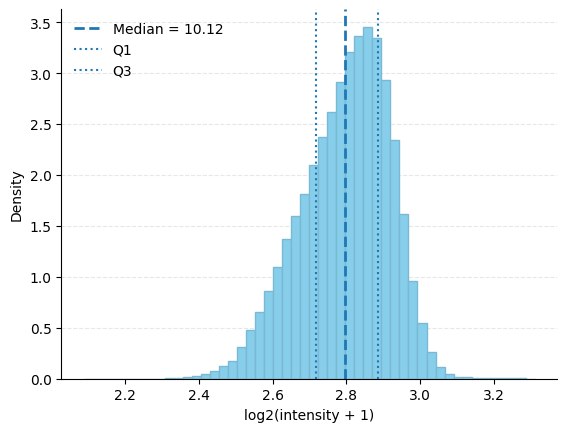

In [64]:
def darker(color, factor=0.8):
    r, g, b = mcolors.to_rgb(color)
    return (r*factor, g*factor, b*factor)

color = "skyblue"

log_intensities = np.log2(df_no_control_multi_peptide_proteins_50pct.drop(columns=["condition"]).values.flatten() + 1)  # flatten all protein intensities
log_intensities = log_intensities[~np.isnan(log_intensities)]

plt.hist(
    log_intensities, 
    bins=50, 
    color=color, 
    edgecolor=darker(color,0.90), 
    linewidth=1,
    density=True,
)
plt.axvline(np.mean(log_intensities), linestyle="--", linewidth=2, label=f"Median = {median:.2f}")
plt.axvline(np.percentile(log_intensities, 25), linestyle=":", linewidth=1.5, label="Q1")
plt.axvline(np.percentile(log_intensities, 75), linestyle=":", linewidth=1.5, label="Q3")

plt.xlabel("log2(intensity + 1)")
plt.ylabel("Density")
# plt.title("Distribution of protein intensities")

ax = plt.gca()
plt.grid(axis='y', alpha=0.3, linestyle="--")
ax.set_axisbelow(True)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
plt.legend(frameon=False)

plt.savefig("plots/PXD030304/PXD030304_no_control_multi_peptide_proteins_50pct_protein_intensities.png")
plt.show()

Dataset missing rate:

In [65]:
df_no_control_multi_peptide_proteins_50pct.isna().sum().sum() / df_no_control_multi_peptide_proteins_50pct.size

np.float64(0.11265496544992788)

Analysis per tissue

## Continuing A.2. Analysis

### Batch effects

In [66]:
pxd030304_no_control_multi_peptide_50pct_tissue_df = pd.read_csv("../../data/processed/PXD030304/PXD030304_no_control_multi_peptide_50pct_tissue.csv", index_col=0)

In [67]:
# Tissue of PXD030304-Sample-2 was int, so that induced a missing value during the mapping to the tissue
# "PXD030304-Sample-2" in pxd030304_no_control_multi_peptide_50pct_tissue_df.index
# pxd030304_no_control_multi_peptide_50pct_tissue_df[pxd030304_no_control_multi_peptide_50pct_tissue_df.index == "PXD030304-Sample-2"]["Tissue"]
# pxd030304_no_control_multi_peptide_50pct_tissue_df[pxd030304_no_control_multi_peptide_50pct_tissue_df["tissue"].isna()]

In [68]:
pxd030304_no_control_multi_peptide_50pct_tissue_df.shape

(949, 5209)

In [69]:
pxd030304_no_control_multi_peptide_50pct_tissue_df["tissue"].describe() # expecting count == number of samples

count      949
unique      28
top       Lung
freq       187
Name: tissue, dtype: object

Fill missing values with 0

In [70]:
pxd030304_no_control_multi_peptide_50pct_tissue_df = pxd030304_no_control_multi_peptide_50pct_tissue_df.fillna(0)

In [71]:
pxd030304_no_control_multi_peptide_50pct_tissue_df.columns

Index(['A0A0U1RRL7', 'A0AV96', 'A0AVT1', 'A0FGR8', 'A0MZ66', 'A1L020',
       'A1L0T0', 'A1L390', 'A1X283', 'A2RRP1',
       ...
       'Q9Y6V7', 'Q9Y6W5', 'Q9Y6X4', 'Q9Y6X5', 'Q9Y6X8', 'Q9Y6X9', 'Q9Y6Y0',
       'Q9Y6Y8', 'Tissue', 'tissue'],
      dtype='object', length=5209)

In [72]:
reducer = umap.UMAP(
    n_neighbors=15,
    min_dist=1.0,
    n_components=2,
    random_state=42
)

embedding = reducer.fit_transform(
    pxd030304_no_control_multi_peptide_50pct_tissue_df.drop(columns=["Tissue", "tissue"])
)

/Users/ritagama/Documents/repos/GainPro/.gain/lib/python3.14/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [73]:
import matplotlib.cm as cm

In [74]:
tissues = pxd030304_no_control_multi_peptide_50pct_tissue_df["tissue"]
labels = pd.unique(tissues)

mapping = {label: i for i, label in enumerate(labels)}
codes = [mapping[v] for v in tissues]

print(labels)
print(mapping)
print(codes)

['Haematopoietic and Lymphoid' 'Kidney' 'Pancreas' 'Thyroid' 'Lung' 'Skin'
 'Peripheral Nervous System' 'Bone' 'Large Intestine' 'Esophagus'
 'Endometrium' 'Breast' 'Cervix' 'Liver' 'Ovary' 'Stomach' 'Head and Neck'
 'Soft Tissue' 'Central Nervous System' 'Bladder' 'Biliary Tract'
 'Small Intestine' 'Placenta' 'Prostate' 'Testis' 'Other tissue'
 'Adrenal Gland' 'Vulva']
{'Haematopoietic and Lymphoid': 0, 'Kidney': 1, 'Pancreas': 2, 'Thyroid': 3, 'Lung': 4, 'Skin': 5, 'Peripheral Nervous System': 6, 'Bone': 7, 'Large Intestine': 8, 'Esophagus': 9, 'Endometrium': 10, 'Breast': 11, 'Cervix': 12, 'Liver': 13, 'Ovary': 14, 'Stomach': 15, 'Head and Neck': 16, 'Soft Tissue': 17, 'Central Nervous System': 18, 'Bladder': 19, 'Biliary Tract': 20, 'Small Intestine': 21, 'Placenta': 22, 'Prostate': 23, 'Testis': 24, 'Other tissue': 25, 'Adrenal Gland': 26, 'Vulva': 27}
[0, 1, 0, 2, 3, 4, 5, 6, 6, 7, 7, 7, 1, 8, 0, 8, 8, 4, 8, 5, 9, 10, 5, 3, 5, 5, 11, 5, 4, 4, 4, 4, 4, 4, 3, 4, 4, 4, 5, 0, 12, 7, 

In [75]:
import seaborn as sns

In [76]:
# annotate tissue labels to be <tissue> (N = <number of cell lines from that tissue>)
tissues_counts = tissues.value_counts()
annotated_tissues = tissues.map(lambda x: f"{x} (n={tissues_counts[x]})")
print(annotated_tissues)

sample_accession
PXD030304-Sample-1      Haematopoietic and Lymphoid (n=163)
PXD030304-Sample-10                           Kidney (n=32)
PXD030304-Sample-100    Haematopoietic and Lymphoid (n=163)
PXD030304-Sample-101                        Pancreas (n=30)
PXD030304-Sample-102                         Thyroid (n=16)
                                       ...                 
PXD030304-Sample-95                         Pancreas (n=30)
PXD030304-Sample-96                  Large Intestine (n=47)
PXD030304-Sample-97           Central Nervous System (n=53)
PXD030304-Sample-98                           Cervix (n=13)
PXD030304-Sample-99                  Large Intestine (n=47)
Name: tissue, Length: 949, dtype: object


In [77]:
import colorcet as cc

In [78]:
unique_tissues = pd.unique(annotated_tissues)
palette = sns.color_palette(cc.glasbey_light, n_colors=len(unique_tissues), desat=0.55)
color_dict = {label: color for label, color in zip(sorted(unique_tissues), palette)}
print(color_dict)

{'Adrenal Gland (n=1)': (0.6503921568627451, 0.18882352941176472, 0.18882352941176472), 'Biliary Tract (n=4)': (0.1212745098039215, 0.41029411764705886, 0.1191176470588235), 'Bladder (n=18)': (0.6153921568627452, 0.22499999999999998, 0.775), 'Bone (n=40)': (0.18990196078431365, 0.5500980392156865, 0.6061764705882354), 'Breast (n=50)': (0.5506862745098039, 0.775, 0.22499999999999998), 'Central Nervous System (n=53)': (0.8164705882352941, 0.6223529411764706, 0.36784313725490203), 'Cervix (n=13)': (0.9002941176470589, 0.6565686274509803, 0.7816666666666665), 'Endometrium (n=10)': (0.44009803921568624, 0.35598039215686283, 0.38186274509803925), 'Esophagus (n=35)': (0.2232352941176471, 0.768921568627451, 0.6697058823529414), 'Haematopoietic and Lymphoid (n=163)': (0.7480392156862742, 0.726470588235294, 0.9205882352941177), 'Head and Neck (n=39)': (0.5844117647058823, 0.6383333333333334, 0.5499019607843136), 'Kidney (n=32)': (0.4680392156862745, 0.3623529411764706, 0.13588235294117645), 'Lar

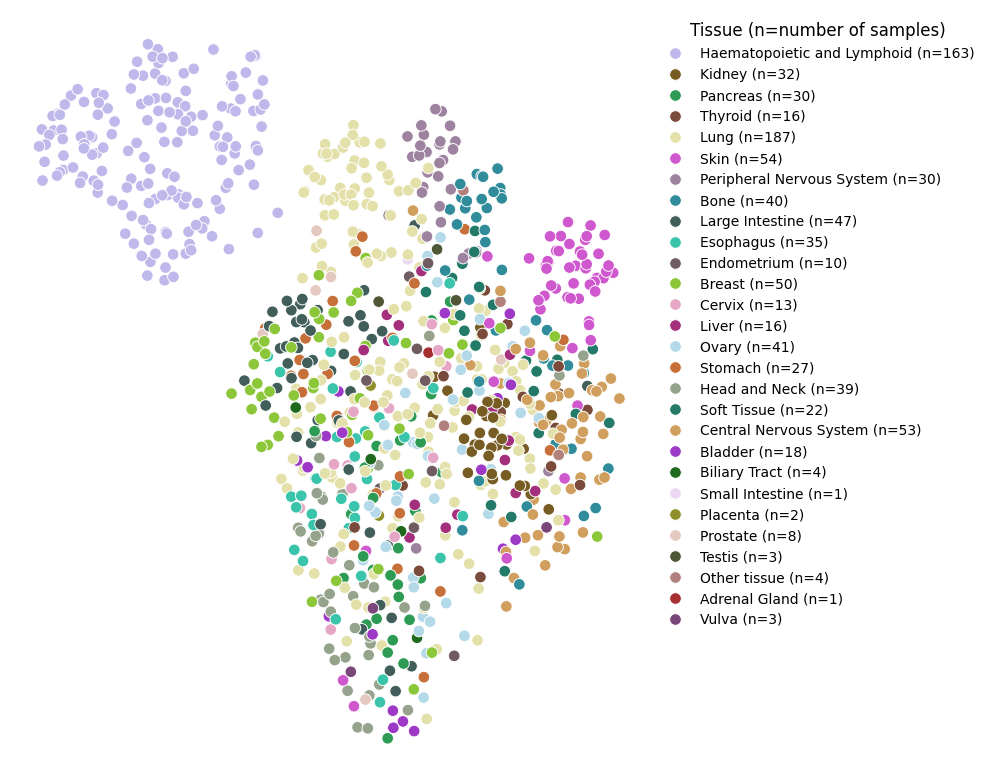

In [81]:
plt.figure(figsize=(10,8))

sns.scatterplot(
    x=embedding[:, 0],
    y=embedding[:, 1],
    hue=annotated_tissues,
    palette=color_dict,
    s=70,
)
plt.axis("off")
plt.legend(bbox_to_anchor=(1, 1), title="Tissue (n=number of samples)", frameon=False, title_fontsize="large")

ax = plt.gca()
ax.spines["top"]

plt.tight_layout()
plt.savefig("plots/PXD030304_no_control_multi_peptide_50pct_tissue/initial_umap.png")
plt.show()

In [80]:
tissues.value_counts()

tissue
Lung                           187
Haematopoietic and Lymphoid    163
Skin                            54
Central Nervous System          53
Breast                          50
Large Intestine                 47
Ovary                           41
Bone                            40
Head and Neck                   39
Esophagus                       35
Kidney                          32
Pancreas                        30
Peripheral Nervous System       30
Stomach                         27
Soft Tissue                     22
Bladder                         18
Liver                           16
Thyroid                         16
Cervix                          13
Endometrium                     10
Prostate                         8
Biliary Tract                    4
Other tissue                     4
Testis                           3
Vulva                            3
Placenta                         2
Small Intestine                  1
Adrenal Gland                    1
Name: count, 

### todo bar plot number of samples/tissue

### A.2.2. Missingness

Overall missingness:

In [109]:
pxd030304_no_control_multi_peptide_50pct_tissue_df = pd.read_csv("../../data/processed/PXD030304/PXD030304_no_control_multi_peptide_50pct_tissue.csv", index_col=0)

In [110]:
pxd030304_no_control_multi_peptide_50pct_tissue_df.shape

(949, 5209)

In [111]:
pxd030304_no_control_multi_peptide_50pct_tissue_df_aux = pxd030304_no_control_multi_peptide_50pct_tissue_df.drop(columns=["Tissue", "tissue"])

In [112]:
pxd030304_no_control_multi_peptide_50pct_tissue_df_aux.shape

(949, 5207)

In [115]:
miss_rate = pxd030304_no_control_multi_peptide_50pct_tissue_df_aux.isna().sum().sum().item() / pxd030304_no_control_multi_peptide_50pct_tissue_df_aux.size
print(f"Overall miss rate of PXD030304 no control multi peptide 50 pct: {miss_rate:.2%}")

Overall miss rate of PXD030304 no control multi peptide 50 pct: 11.27%


Missingness per tissue: